# Tools, theory and analysis

### Execution Style

In [1]:
fastExecution = True       # Whether to use or not pre build short-cut files to skip long execution bloc of codes
savingFigures = False      # Whether to save or not the figures produced
savingData = False         # Whether to build or not the short cut files for future fastExecution

### Libraries

In [2]:
# Import Libraries
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import json
import re
import fa2
import math
import community
import matplotlib.cm as cm
from __future__ import division
import matplotlib.image as mpimg
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import io
from collections import Counter
from wordcloud import WordCloud
from scipy.special import zeta
# Rendering Parameters
title_font = {'family': 'sans-serif',
        'color':  '#000000',
        'weight': 'bold',
        'size': 28,
        }
#COLORS
mBlue = "#55638A"     # For actor
fRed = "#9E1030"    # For actress

## Get the cleaned Data

The cleaning and preprocessing of data can be found in [Explainer notebook part 1 and 2](http://nbviewer.jupyter.org/github/s134265/socialgraphs2018/blob/master/Project/Explainer%20notebook%20part%201%20and%202.ipynb). 

Here we get the movies and actors data frames (moviesDF,actorsDF), the movie age dictionnary (movieAgeDict), the rating one (ratingDict), the movies and actors names dictionnaries (actorNameDict,movieNameDict) and one list containing all the collaboration between actors (actorsLinks)

In [3]:
from dataPreProcess import cleanLoadData
movieAgeDict,ratingDict,actorNameDict,movieNameDict,moviesDF,actorsDF,actorsLinks = cleanLoadData()

#### Actors Data Frame

In [4]:
actorsDF.head(10)

,Gender,Name,iD
0,F,Bobbie Bresee,nm0107679
1,F,Malgorzata Rozniatowska,nm0747647
2,M,Ahmet Ugurlu,nm0880128
3,F,Laura Nativo,nm1137466
4,F,Jordy Benattar,nm0070237
5,M,Özkan Ugur,nm0880126
6,M,John Foss,nm1458561
7,M,Panayiotis Hartomatzidis,nm0367186
8,M,Simon Abkarian,nm0008787
9,F,Victoria Snow,nm0795281


#### Movies Data Frame

In [5]:
moviesDF.sort_values("Rating", ascending=False).head(10)

,Rating,Title,Year,iD
8686,9.1,The Regard of Flight,1983.0,tt0134050
7737,9.0,Notre-Dame de Paris,1999.0,tt0285800
8377,8.9,Ko to tamo peva,1980.0,tt0076276
4887,8.9,12 Angry Men,1957.0,tt0050083
9860,8.9,Schindler's List,1993.0,tt0108052
1157,8.9,The Lord of the Rings: The Return of the King,2003.0,tt0167260
8305,8.8,Saban Oglu Saban,1977.0,tt0253614
1389,8.8,Sobache serdtse,1988.0,tt0096126
2151,8.8,The Art of Amália,2000.0,tt0204839
9079,8.8,The Lord of the Rings: The Fellowship of the Ring,2001.0,tt0120737


## Actors Graph

We choose to build a graph where the nodes are the actors, and the links represent the collaboration between two actors: the movies they both participate in, the ratings they got and the average year of their collaborations

In [6]:
##########################
# Create the actors Graph
##########################
G = nx.Graph()
#add nodes
for i in actorsDF.index:
    G.add_node(actorsDF.loc[i].at["iD"], Name= actorsDF.loc[i, "Name"], Gender = actorsDF.loc[i, "Gender"])


#add links
for link in actorsLinks:
    if link[0]  != link[1]: 
        if G.has_edge(link[0],link[1]):  #Update existing edges                       
            G[link[0]][link[1]]["weight"] +=1 
            G[link[0]][link[1]]["movies"].append(link[2])
            #Average Rating
            avRating = (G[link[0]][link[1]]["avRating"])*(1-1.0/G[link[0]][link[1]]["weight"]) #Former ratings
            avRating += ratingDict[link[2]]/G[link[0]][link[1]]["weight"]  # Added Movie
            G[link[0]][link[1]]["avRating"] = avRating
            #Average Year
            avYear = (G[link[0]][link[1]]["avYear"])*(1-1.0/G[link[0]][link[1]]["weight"]) #Former ratings
            avYear += movieAgeDict[link[2]]/G[link[0]][link[1]]["weight"]  # Added Movie
            G[link[0]][link[1]]["avYear"] = avYear
        else: #Create new edge
            G.add_edge(link[0], link[1], 
                       weight = 1, 
                       movies = [link[2]], 
                       avRating = ratingDict[link[2]], 
                       avYear = movieAgeDict[link[2]]) 

### Clean the graph

We took the giant component to have a connected graph to study. We also save the graph into a gml file to be able to reuse it in another file without having to rebuild it entirely.

In [7]:
##################
# Clean the Graph
##################

G =  max(nx.connected_component_subgraphs(G), key=len)
if savingData:
    nx.write_gml(G, 'obj/full.gml') 

### Visualize the graph

In [8]:
#################################################
# Set the node colors actording to actors gender
#################################################

def getColors(graph):
    mBlue = "#55638A"     # For actor
    fRed = "#9E1030"    # For actress
    colors = {}  # Build the color 
    k=0
    for n in graph.nodes:
        if graph.nodes[n]['Gender'] == "F":    
            colors[n]= fRed
        else:
            colors[n]= mBlue
    return colors

In [9]:
###############################################
# Set the edge colors actording to movie years
###############################################

def getEdgeColors(graph):
    c1930 = "#c12424"
    c1955 = "#ff6612"
    c1980 = "#ffce00"
    c1995 = "#e3f018"
    cNow = "#bdff00"
    edgesColors = {}  
    for e in G.edges:
        edgesColors[e] = c1930
        if graph.get_edge_data(*e)["avYear"]>1930:
            edgesColors[e] = c1955
        if graph.get_edge_data(*e)["avYear"]>1955:
            edgesColors[e] = c1980
        if graph.get_edge_data(*e)["avYear"]>1980:
            edgesColors[e] = c1995
        if graph.get_edge_data(*e)["avYear"]>1995:
            edgesColors[e] = cNow
    return edgesColors

The edges will have colors according to the average year of the two actors collaborations, from red for old movies to green for the most recent ones.

In [10]:
###########################################################
# Set the size of the nodes according to outgoing strength
###########################################################

sizes = {}
actorsDF["Collab"] = pd.Series(np.zeros(len(actorsDF.index))) #to store the outgoing strength
for i in actorsDF.index:
    iD =actorsDF.loc[i].at["iD"]
    if iD in G.nodes():
        edges = list(G.edges(iD))
        ogStrength = 0
        for e in edges:
            ogStrength += G.get_edge_data(*e)["weight"] 
        actorsDF.loc[i, "Collab"]= ogStrength 
        sizes[iD] = ogStrength
    else :
        actorsDF.loc[i, "Collab"]= 0
actorsDF=actorsDF.sort_values("Collab", ascending=False)

The outgoing strength here correponds to the number of times an actor has collaborated with other. It tends to grow with the number of movies done and the number of actors in those movies. Then it represent the importance of the actor in the industry. </br>
We add the names of the 10 biggest actors on the plot.

In [11]:
####################################################################
# Display the name of the actors with the biggest outgoing strength
####################################################################

SortedNames = np.asarray(actorsDF["Name"])
SortedNames = SortedNames[:10]
labels = {}
for n in G.nodes():
    name = actorNameDict[n]
    if name in SortedNames:
        labels[n]="\n\n"+name
    else:
        labels[n]=""

In [12]:
########################
# Force Atlas Algorithm
########################
forceatlas2 = fa2.ForceAtlas2(
                          # Behavior alternatives
                          outboundAttractionDistribution=False,  # Dissuade hubs
                          linLogMode=False,  # NOT IMPLEMENTED
                          adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                          edgeWeightInfluence=1.0,

                          # Performance
                          jitterTolerance=1.0,  # Tolerance
                          barnesHutOptimize=True,
                          barnesHutTheta=1.2,
                          multiThreaded=False,  # NOT IMPLEMENTED

                          # Tuning
                          scalingRatio=0.005,
                          strongGravityMode=False,
                          gravity=20,

                          # Log
                          verbose=True)

The position can be obtained by the force atlas algorithm but as the graph is pretty big it is pretty long (about 15 mn). To make it faster we save the position dictionnary in a txt file, and we can directly read the positions from this file.

In [13]:
####################
# Get the positions
####################

pos={} # Position of the nodes in the force2 algorithm
if fastExecution:
    path = "DATA/forceAtlasPositions.txt"
    files = io.open(path, mode="r", encoding="utf-8")
    for row in files:
        split = row.split("\t")
        pos[split[0]] = (float(split[1]),float(split[2]))
    files.close()
else:
    pos = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=3000) #~15 mn
    if savingData:
        #Store the positions in a text file
        path = "DATA/forceAtlasPositions.txt"
        files = io.open(path, mode="w", encoding="utf-8")
        for key in pos.keys():
            row = key +"\t" + str(pos[key][0]) +"\t"+str(pos[key][1])+"\r\n"
            files.write(row.replace("u'","").replace("'",""))
        files.close()

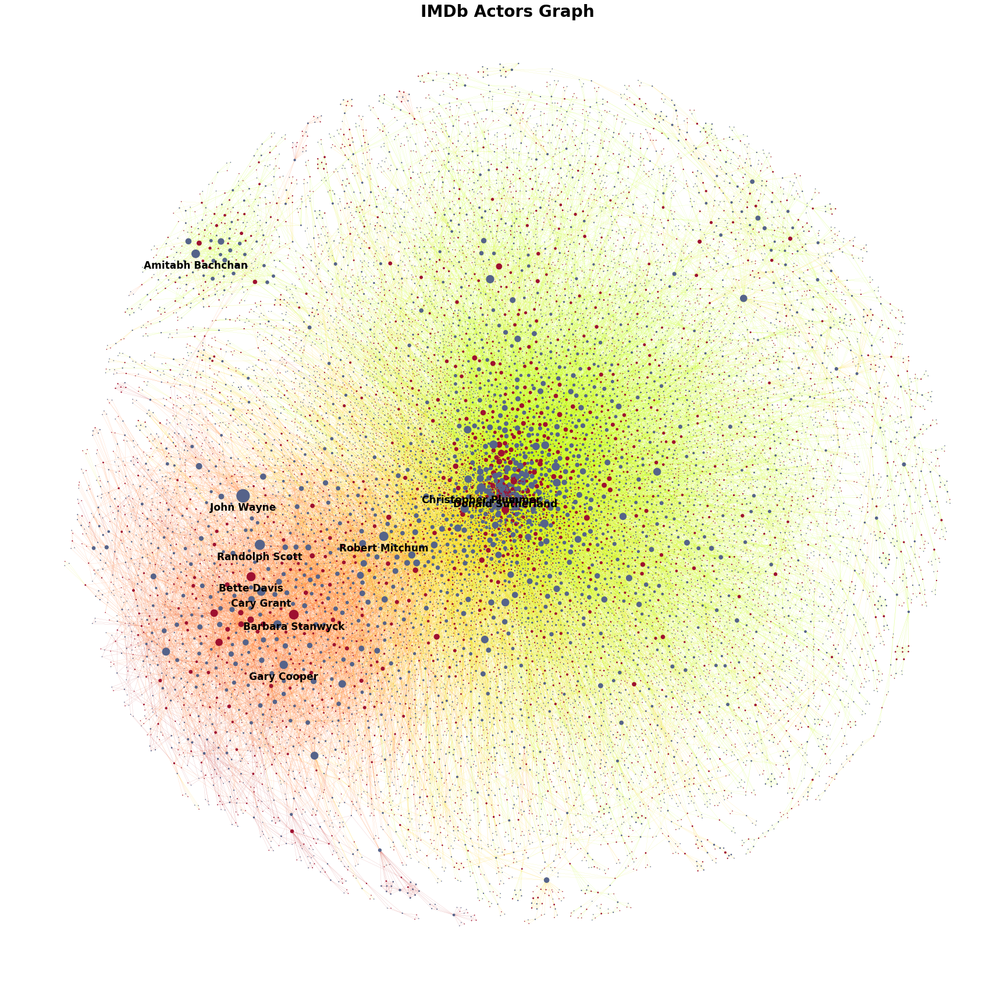

In [14]:
#######
# Draw
#######
colors = getColors(G)
edgesColors = getEdgeColors(G)
fig = plt.figure(figsize=(30, 30))
nx.draw_networkx(G, pos, 
                 node_size = [(0.2*sizes[n])**(2) for n in G.nodes()],  
                 node_color = [colors[n] for n in G.nodes()],
                 with_labels=True,
                 width = 0.1,
                 edge_color=[edgesColors[e] for e in G.edges()],
                 labels = labels,
                 font_size = 17, 
                 font_weight= "bold")
plt.axis('off')
plt.title("IMDb Actors Graph", fontdict = title_font )
base = 'Figures/actorGraph'
if savingFigures:
    plt.savefig(base+'.jpeg', bbox_inches='tight')
    plt.savefig(base+'.svg', bbox_inches='tight')
plt.show()

We can distinguish 3 groups:
* on the left in red, old actors (before 1970)
* on the upper left, Indian actors
* in the middle, more recent actors

## Separate the graph by period

### Basic period statistics

Let's build a function to get a distribution histogram from a list or an array of data.

In [15]:
######################
# HISTOGRAM FUNCTION
######################

def histogram(degrees, dens): # degrees (list or array of data), dens (whether it is a density histogram or not)
    # Computing Bins
    min_bin = np.amin(degrees)
    max_bin = np.amax(degrees)
    nb_bins = int(math.ceil(max_bin)-math.floor(min_bin))
    v = np.empty(nb_bins+1)
    v[nb_bins] = int(math.ceil(max_bin))
    bins = np.empty(nb_bins)
    for i in range(nb_bins):
        v[i] = int(min_bin + i)
        bins[i] = int(min_bin + i)

    #Hist
    hist, bin_edges = np.histogram(degrees,bins = v,density=dens)
    return hist, bin_edges

Let's look how the movies and collaborations a spread across the years

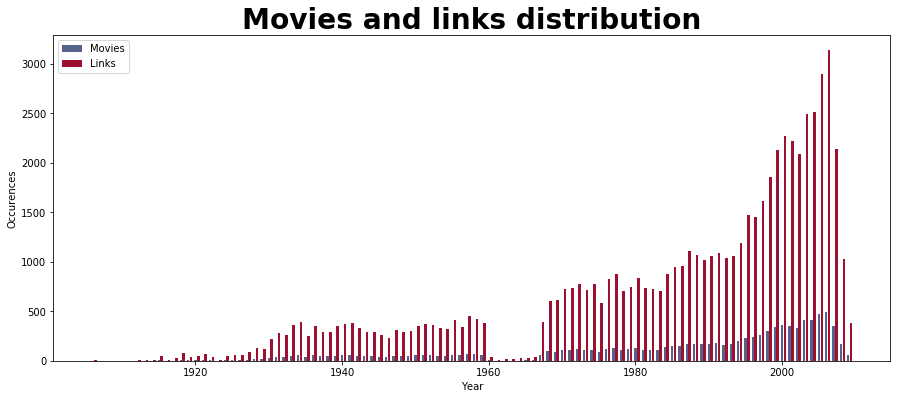

In [16]:
##################################
# HISTOGRAM OF THE MOVIES BY YEAR
##################################

moviesYear = np.asarray(moviesDF["Year"])
linksYear = []
for link in actorsLinks:
    if link[0] != link[1]:
        year = movieAgeDict[link[2]]
        linksYear.append(year)


# Get the histograms
histM, binsM = histogram(moviesYear,False)
histL, binsL = histogram(linksYear,False)

plt.figure(figsize = (15,6))
plt.bar(binsM[:-1], histM, 0.35, color=mBlue, label = "Movies")
plt.bar([b+0.4 for b in binsL[:-1]], histL, 0.35, color=fRed, label = "Links")
plt.xlabel('Year')
plt.ylabel('Occurences')
plt.title('Movies and links distribution', fontdict = title_font)
plt.legend()
base = 'Figures/moviesDist'
if savingFigures:
    plt.savefig(base+'.jpeg', bbox_inches='tight')
    plt.savefig(base+'.png', bbox_inches='tight')
    plt.savefig(base+'.svg', bbox_inches='tight')
plt.show()

So we divide the data into movies from before 1970, then between 1970 and 1980, 1980 and 1990, 1990 and 2000 and finally after 2000

In [17]:
############################
# REPARTITION AMONG PERIODS
############################

periods = [1900,1970,1980,1990,2000]
moviesByPeriods = np.zeros(5,dtype=int)
linksByPeriods = np.zeros(5,dtype=int)
nMovies = 0
nLinks = 0

for i in moviesDF.index:
    age = moviesDF.loc[i, "Year"]
    nMovies +=1
    if age < 1970:
        moviesByPeriods[0]+=1
    elif age < 1980:
        moviesByPeriods[1]+=1
    elif age < 1990:
        moviesByPeriods[2]+=1
    elif age < 2000:
        moviesByPeriods[3]+=1
    else:
        moviesByPeriods[4]+=1

for e in G.edges():
    age = G.get_edge_data(*e)["avYear"]
    nLinks +=1
    if age < 1970:
        linksByPeriods[0]+=1
    elif age < 1980:
        linksByPeriods[1]+=1
    elif age < 1990:
        linksByPeriods[2]+=1
    elif age < 2000:
        linksByPeriods[3]+=1
    else:
        linksByPeriods[4]+=1
        
print "Period 1900-1970: "+str(moviesByPeriods[0])+"("+str(round(100*moviesByPeriods[0]/nMovies,2))+"%)"+" movies"+" - "+str(linksByPeriods[0])+"("+str(round(100*linksByPeriods[0]/nLinks,2))+"%)"+" links."
print "Period 1970-1980: "+str(moviesByPeriods[1])+"("+str(round(100*moviesByPeriods[1]/nMovies,2))+"%)"+" movies"+" - "+str(linksByPeriods[1])+"("+str(round(100*linksByPeriods[1]/nLinks,2))+"%)"+" links"
print "Period 1980-1990: "+str(moviesByPeriods[2])+"("+str(round(100*moviesByPeriods[2]/nMovies,2))+"%)"+" movies"+" - "+str(linksByPeriods[2])+"("+str(round(100*linksByPeriods[2]/nLinks,2))+"%)"+" links"
print "Period 1990-2000: "+str(moviesByPeriods[3])+"("+str(round(100*moviesByPeriods[3]/nMovies,2))+"%)"+" movies"+" - "+str(linksByPeriods[3])+"("+str(round(100*linksByPeriods[3]/nLinks,2))+"%)"+" links"
print "Period 2000+:     "+str(moviesByPeriods[4])+"("+str(round(100*moviesByPeriods[4]/nMovies,2))+"%)"+" movies"+" - "+str(linksByPeriods[4])+"("+str(round(100*linksByPeriods[4]/nLinks,2))+"%)"+" links"

Period 1900-1970: 1920(18.96%) movies - 11050(20.96%) links.
Period 1970-1980: 1119(11.05%) movies - 5978(11.34%) links
Period 1980-1990: 1413(13.96%) movies - 7441(14.11%) links
Period 1990-2000: 2251(22.23%) movies - 12120(22.99%) links
Period 2000+:     3421(33.79%) movies - 16138(30.61%) links


### Build Period Graphs

Build a function to get the graph corresponding to a specific period

In [18]:
###################################
# Graph per period function
###################################
def graphPeriod(start,end):
    G_per = nx.Graph()
    #add nodes
    for i in actorsDF.index:
        G_per.add_node(actorsDF.loc[i].at["iD"], Name= actorsDF.loc[i, "Name"], Gender = actorsDF.loc[i, "Gender"])

    #add links
    for link in actorsLinks:
        if (start < movieAgeDict[link[2]]) and (movieAgeDict[link[2]]<= end):
            if link[0]  != link[1]: 
                if G_per.has_edge(link[0],link[1]):                         
                    G_per[link[0]][link[1]]["weight"] +=1 
                    G_per[link[0]][link[1]]["movies"].append(link[2])
                    G_per[link[0]][link[1]]["avRating"] = (G_per[link[0]][link[1]]["avRating"])*(1-1.0/G_per[link[0]][link[1]]["weight"])+ratingDict[link[2]]/G_per[link[0]][link[1]]["weight"]
                    G_per[link[0]][link[1]]["avYear"] = (G_per[link[0]][link[1]]["avYear"])*(1-1.0/G_per[link[0]][link[1]]["weight"])+movieAgeDict[link[2]]/G_per[link[0]][link[1]]["weight"]
                else:
                    G_per.add_edge(link[0], link[1], weight = 1, movies = [link[2]], avRating = ratingDict[link[2]], avYear = movieAgeDict[link[2]]) 

    #take the giant component
    G_per=max(nx.connected_component_subgraphs(G_per), key=len)
    print "There are "+str(G_per.number_of_nodes()) +" nodes(actors) and "+ str(G_per.number_of_edges())+ " links(movie collaboration) in "+str(start)+'-'+str(end)+" period."
    return G_per

In [19]:
###################################
# Subdivide the network by period
###################################

graphByPeriod = {}
for i in range(len(periods)):
    if i <4:
        gph = graphPeriod(periods[i],periods[i+1])
        if savingData:
            nx.write_gml(G, 'obj/graph_'+str(periods[i+1])+'.gml') 
        graphByPeriod[str(periods[i+1])]=gph
    else:
        gph = graphPeriod(periods[i],2020)
        graphByPeriod["now"]=gph
        if savingData:
            nx.write_gml(G, 'obj/graph_now.gml') 

# Graph Titles
titles = {}
titles["1970"] = "1900-1970"
titles["1980"] = "1970-1980"
titles["1990"] = "1980-1990"
titles["2000"] = "1990-2000"
titles["now"] = "2000+"

There are 3175 nodes(actors) and 10999 links(movie collaboration) in 1900-1970 period.
There are 2072 nodes(actors) and 5123 links(movie collaboration) in 1970-1980 period.
There are 2569 nodes(actors) and 6171 links(movie collaboration) in 1980-1990 period.
There are 4302 nodes(actors) and 11573 links(movie collaboration) in 1990-2000 period.
There are 5049 nodes(actors) and 12859 links(movie collaboration) in 2000-2020 period.


### Visualization

Same as before for the full graph, there are two options either directly with the force atlas algorithm or with the short-cut files.

In [20]:
################################
# Graph per period positionning
################################
positionsPeriod = {}

if not fastExecution:
    count = 0
    for key in graphByPeriod:
        p = forceatlas2.forceatlas2_networkx_layout(graphByPeriod[key], pos=None, iterations=3000)
        positionsPeriod[key] = p
        if savingData:
            #Build a shortcut to speed up and not re-run the algorithm
            #Store the positions in a text file
            path = "DATA/forceAtlasPositions_"+str(periods[count])+".txt"
            files = io.open(path, mode="w", encoding="utf-8")
            for key in p.keys():
                row = key +"\t" + str(p[key][0]) +"\t"+str(p[key][1])+"\r\n"
                files.write(row.replace("u'","").replace("'",""))
            files.close()
            count+=1
else:    
    #Get the Dictionnary
    count = 0
    for key in graphByPeriod:
        posit={}
        path = "DATA/forceAtlasPositions_"+str(periods[count])+".txt"
        files = io.open(path, mode="r", encoding="utf-8")
        for row in files:
            split = row.split("\t")
            posit[split[0]] = (float(split[1]),float(split[2]))
        files.close()
        positionsPeriod[key] = posit
        count+=1

In [21]:
################
# DRAW FUNCTION
################

#Auxiliary function
def getSecond(a):
    return a[1]

def draw(graph,ttl,posi):
    colors = getColors(graph)  # Build the color and size arrays

    #SIZE
    # Get the actor/actress with the biggest number of collaborations
    sizes = {}
    os = []
    sizeMax =0
    for iD in graph.nodes():
        edges = list(graph.edges(iD))
        ogStrength = 0
        for e in edges:
            ogStrength += graph.get_edge_data(*e)["weight"] 
        sizes[iD] = ogStrength
        os.append((graph.nodes[iD]["Name"],ogStrength))
        if ogStrength > sizeMax:
            sizeMax = ogStrength

    #LABEL
    # Build a label dictionnary with the name of the members to highlight
    SortedNames = np.asarray(sorted(os, key=getSecond,reverse = True))[:,0]
    SortedNames = SortedNames[:10]
    labels = {}
    for n in graph.nodes():
        name = actorNameDict[n]
        if name in SortedNames:
            labels[n]="\n\n"+name
        else:
            labels[n]=""

    #POSITIONNING
    positions = posi

    alpha =25/sizeMax
    fig = plt.figure(figsize=(30, 30))
    nx.draw_networkx(graph, positions, 
                     node_size = [(alpha*sizes[n])**(2) for n in graph.nodes()],  node_color = [colors[n] for n in graph.nodes()],
                     with_labels=True,
                     width = 0.1,edge_color='#999999',labels = labels,font_size = 17, font_weight= "bold")
    plt.axis('off')
    plt.title("Actors Graph Period "+ttl, fontdict = title_font  )
    base = 'Figures/actorGraph_'+ttl
    if savingFigures:
        plt.savefig(base+'.jpeg', bbox_inches='tight')
        plt.savefig(base+'.png', bbox_inches='tight')
        plt.savefig(base+'.svg', bbox_inches='tight')
    plt.show()

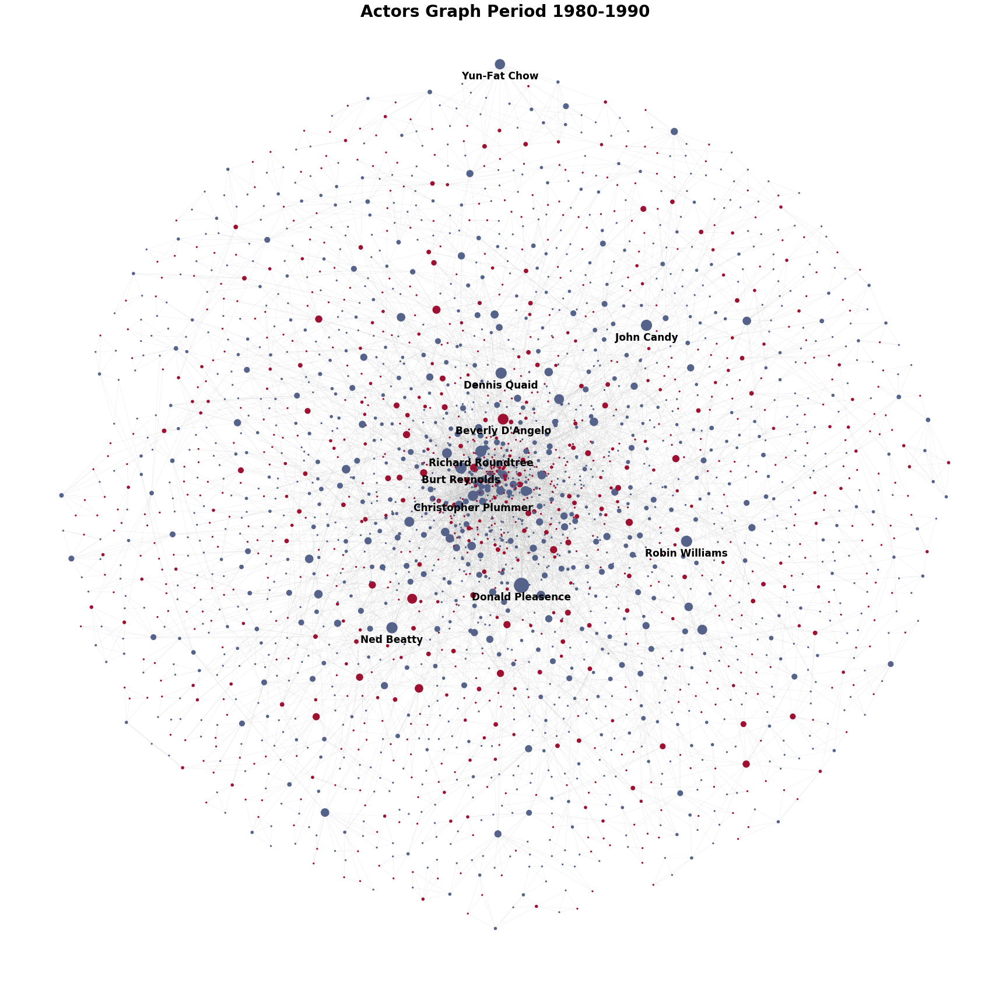

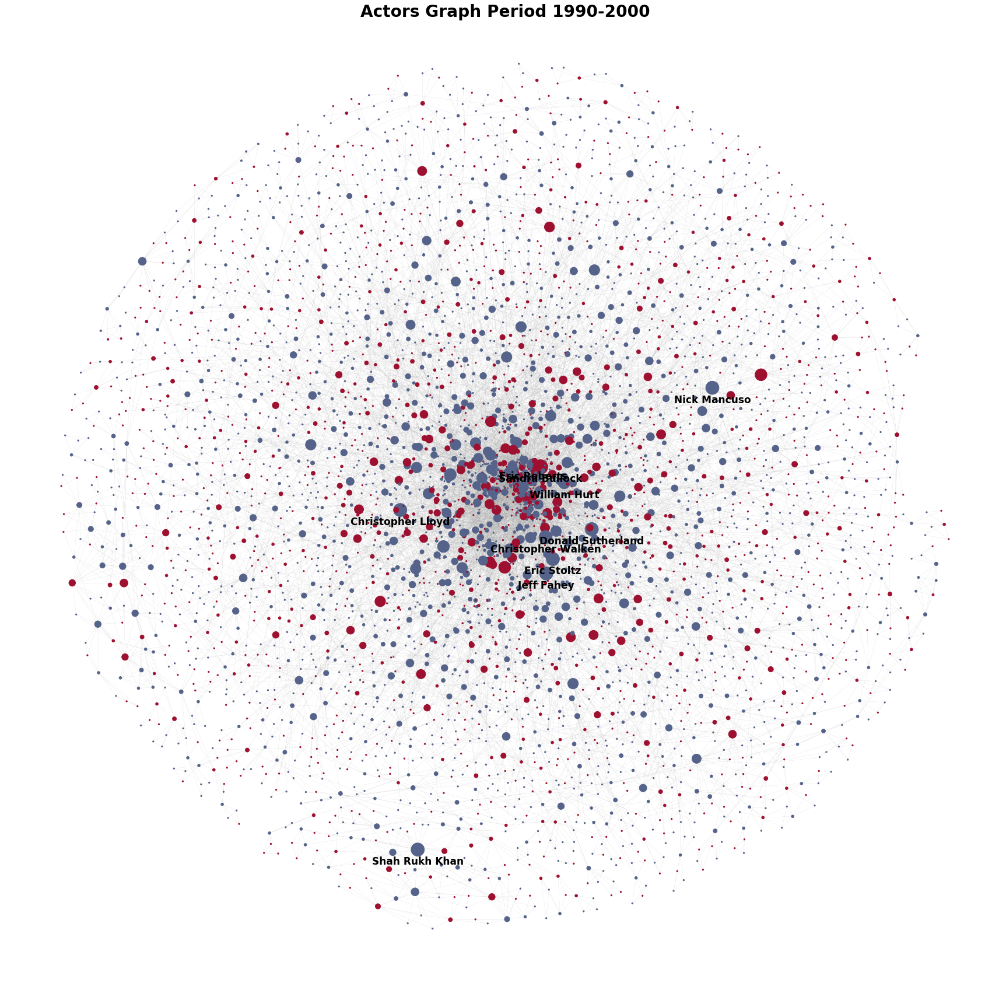

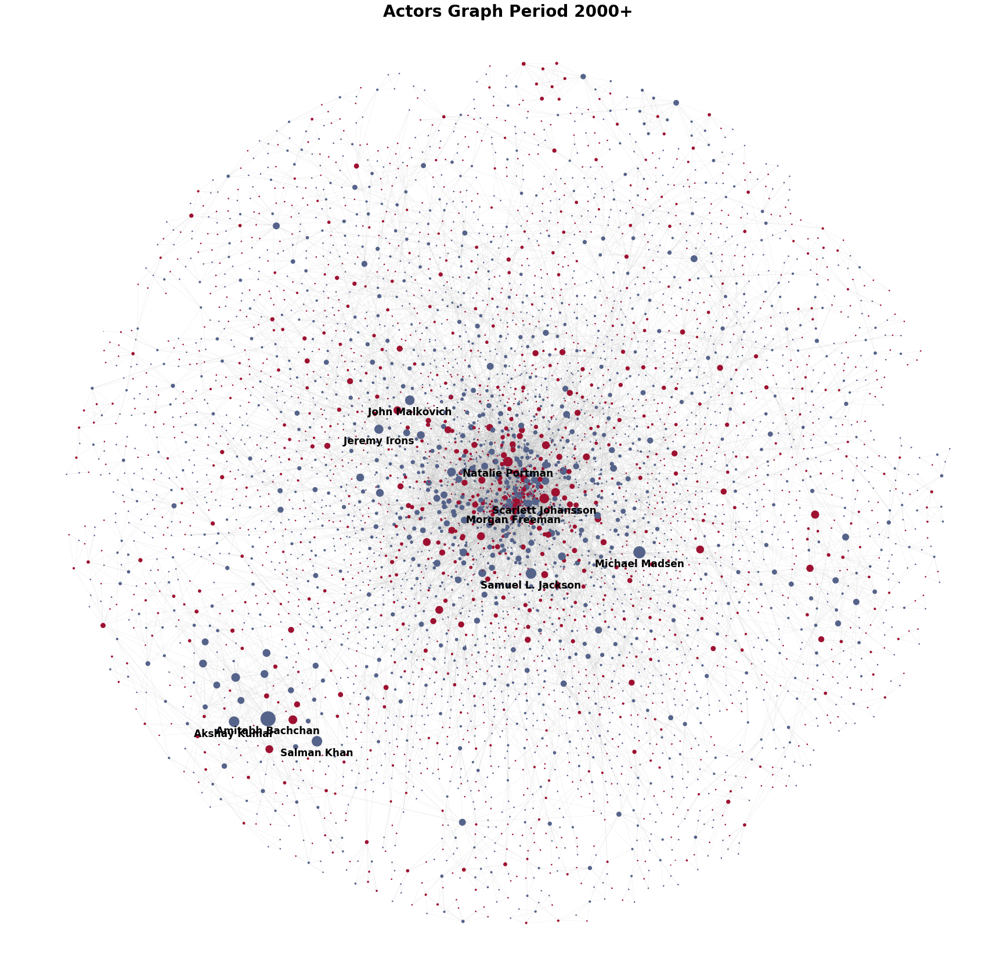

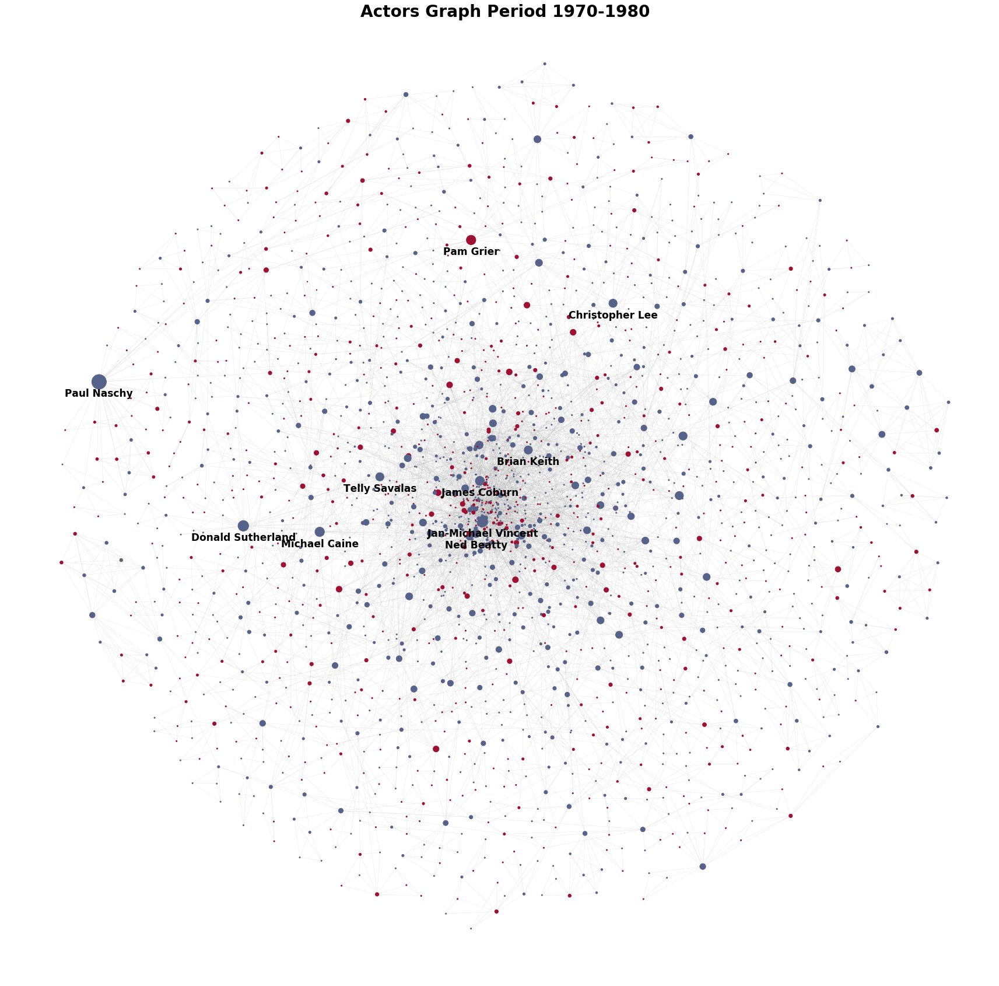

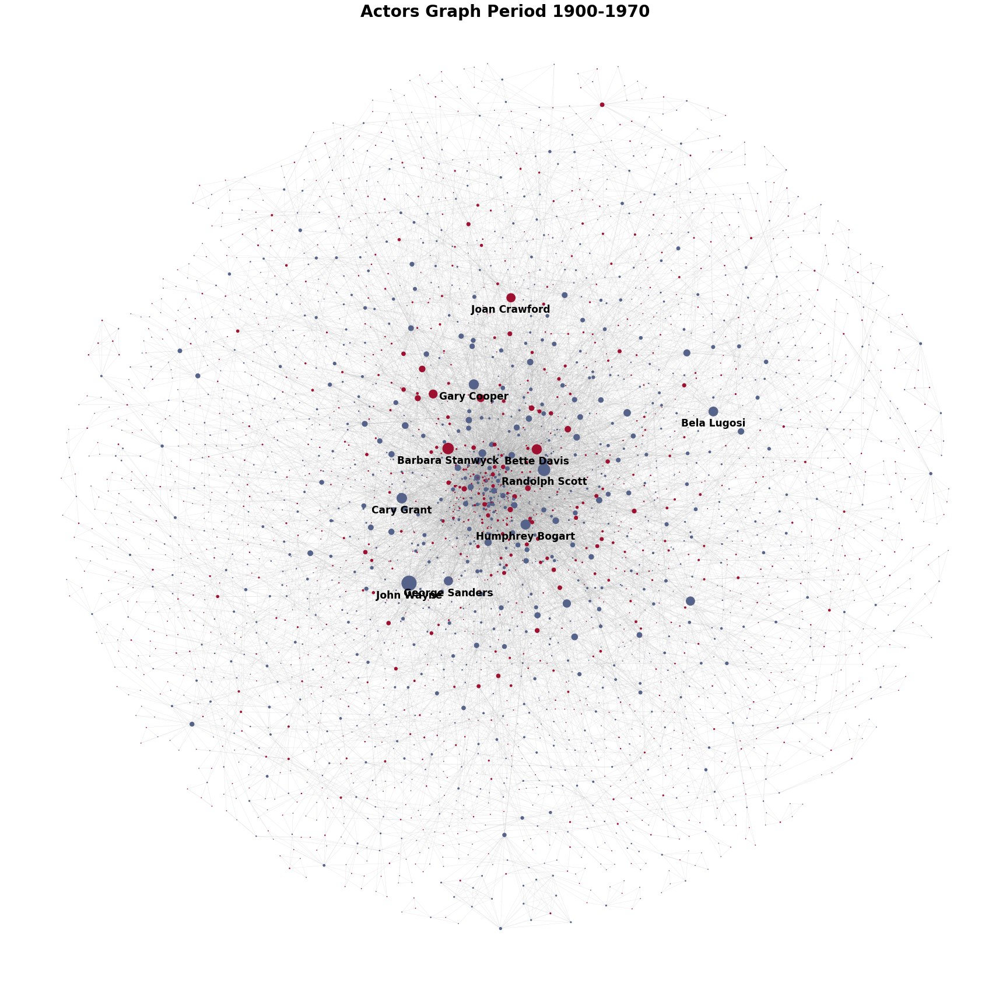

In [22]:
####################
# Draw the networks
####################

for key in graphByPeriod.keys():
    draw(graphByPeriod[key],titles[key], positionsPeriod[key])

## Statistics

### Degree Analysis

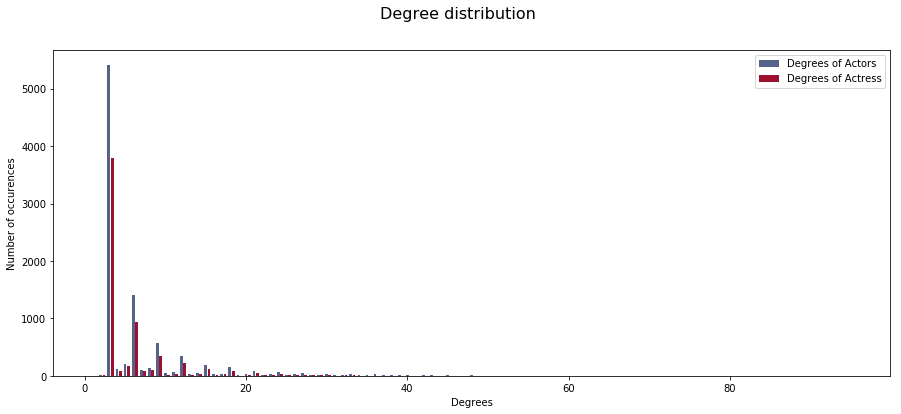

In [31]:
################################
# Display the degrees histogram 
################################

# Get the degrees
mDegrees = [G.degree(n) for n in G.nodes() if G.nodes[n]["Gender"] == "M"]
fDegrees = [G.degree(n) for n in G.nodes() if G.nodes[n]["Gender"] == "F"]
degrees = [G.degree(n) for n in G.nodes()]

# Get the histograms
histM, binsM = histogram(mDegrees,False)
histF, binsF = histogram(fDegrees,False)
histD, binsD = histogram(degrees,True)

# Plot
plt.figure(figsize = (15,6))
plt.bar(binsM[:-1], histM, 0.35, color=mBlue, label = "Degrees of Actors")
plt.bar([b+0.4 for b in binsF[:-1]], histF, 0.35, color=fRed, label = "Degrees of Actress")
plt.xlabel('Degrees')
plt.ylabel('Number of occurences')
plt.suptitle('Degree distribution', fontsize=16)
plt.legend()
base = 'Figures/degreeDist'
if savingFigures:
    plt.savefig(base+'.jpeg', bbox_inches='tight')
    plt.savefig(base+'.png', bbox_inches='tight')
    plt.savefig(base+'.svg', bbox_inches='tight')
plt.show()

Let's compare the degree distributions with random networks ones (Poisson) and scale free ones.

In [30]:
#######################
# Degree distributions 
#######################

def PoissDegree(ks,avg):
    return [np.exp(-avg)*avg**k/math.factorial(int(k)) for k in ks]
def ScaleFreeDegree(ks,gamma):
    return [k**(-gamma)/zeta(gamma) for k in ks]

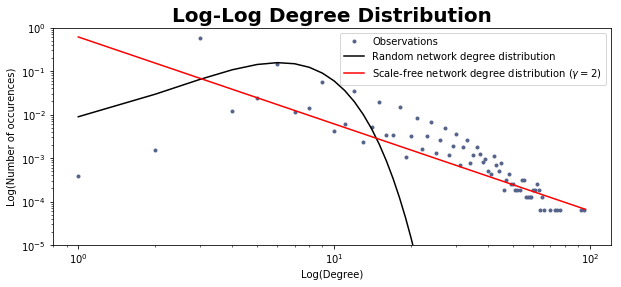

In [36]:
################################################
# Degree distributions ploting on log log scale
################################################

# Log-Log Plot zoom on scale free
plt.figure(figsize = (10,4))
title_font['size'] = 20
plt.title("Log-Log Degree Distribution", fontdict = title_font)
plt.loglog(binsD[:-1], histD, '.', color=mBlue)
plt.xlabel('Log(Degree)')
plt.ylabel('Log(Number of occurences)')
plt.ylim(1e-5,1)
avg = np.mean(degrees)
ks = np.linspace(1,np.max(degrees),np.max(degrees))
plt.loglog(ks,PoissDegree(ks,avg),"-",color="k")
plt.loglog(ks,ScaleFreeDegree(ks,2),"-",color="r")
plt.legend(["Observations",
            "Random network degree distribution",
            "Scale-free network degree distribution ($\gamma = 2$)"])
base = 'Figures/loglogZoomDegreeDist'
if savingFigures:
    plt.savefig(base+'.jpeg', bbox_inches='tight')
    plt.savefig(base+'.png', bbox_inches='tight')
    plt.savefig(base+'.svg', bbox_inches='tight')
plt.show()

Let's package the degree analysis in a function to run it over all the period graphs.

In [38]:
#######################
# Full Degree Analysis
#######################

def degreeAnalysis(graph,ttl):
    # Get the degrees
    degrees = [graph.degree(n) for n in graph.nodes()]

    # Get the histograms
    histD, binsD = histogram(degrees,True)

    # Log-Log Plot zoom on scale free
    plt.figure(figsize = (10,4))
    plt.title("Log-Log Degree Distribution of period "+ttl)
    plt.loglog(binsD[:-1], histD, '.', color=mBlue)
    plt.xlabel('Log(Degree)')
    plt.ylabel('Log(Number of occurences)')
    plt.ylim(1e-5,1)
    avg = np.mean(degrees)
    ks = np.linspace(1,np.max(degrees),np.max(degrees))
    plt.loglog(ks,PoissDegree(ks,avg),"-",color="k")
    plt.loglog(ks,ScaleFreeDegree(ks,2),"-",color="r")
    plt.legend(["Observations",
                "Random network degree distribution",
                "Scale-free network degree distribution ($\gamma = 2$)"])
    base = 'Figures/loglogZoomDegreeDist_'+ttl
    if savingFigures:
        plt.savefig(base+'.jpeg', bbox_inches='tight')
        plt.savefig(base+'.png', bbox_inches='tight')
        plt.savefig(base+'.svg', bbox_inches='tight')
    plt.show()

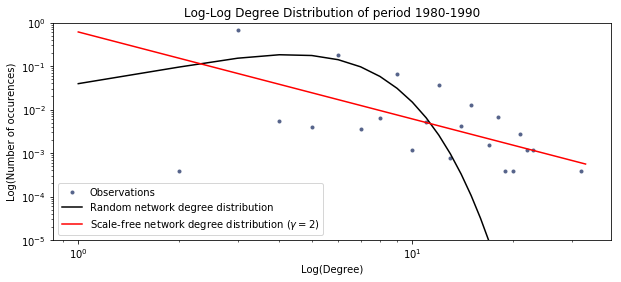

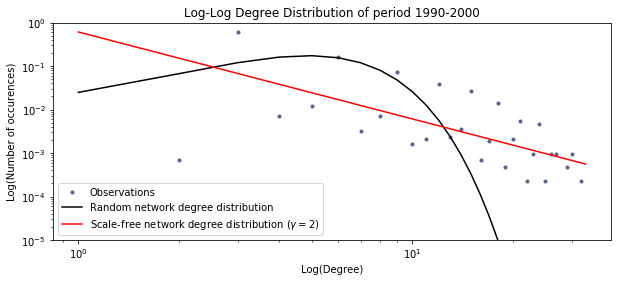

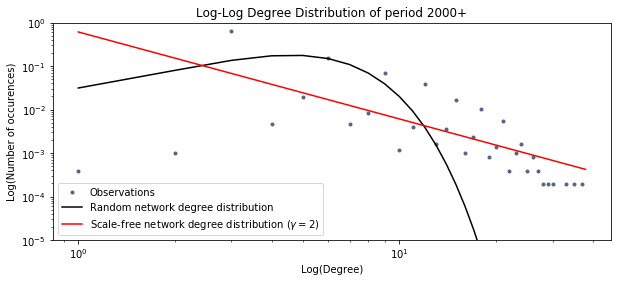

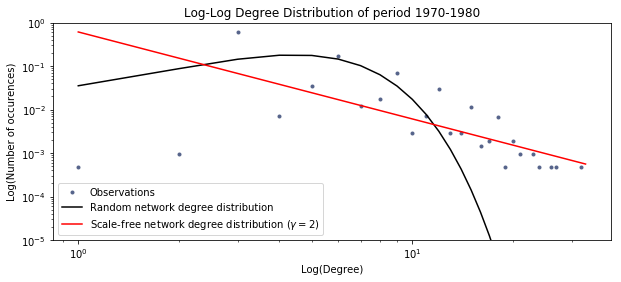

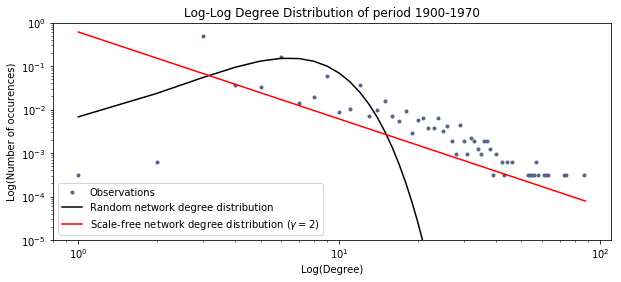

In [39]:
##########################
# Run the Degree Analysis
##########################

for key in graphByPeriod.keys():
    degreeAnalysis(graphByPeriod[key],titles[key])

All the distribution shows that the small degree nodes behave like random networks whereas the large ones tends to act like scale-free networks.